# 🔥 Мониторинг лесных пожаров с помощью компьютерного зрения

**Актуальность проекта:** Лесные пожары представляют одну из самых серьезных угроз для экосистем по всему миру. Ежегодно они уничтожают миллионы гектаров леса, приводят к гибели животных, разрушению экосистем и выбросам огромного количества CO₂ в атмосферу. Согласно данным Global Forest Watch, только в 2023 году мир потерял 4.1 млн гектаров тропических лесов из-за пожаров.

**Проблема:** Традиционные методы обнаружения пожаров (визуальное наблюдение, спутниковый мониторинг с большой задержкой) часто оказываются недостаточно эффективными для раннего обнаружения, что приводит к быстрому распространению огня и увеличению ущерба.

**Решение:** Современные технологии компьютерного зрения и глубокого обучения позволяют автоматизировать процесс мониторинга и раннего обнаружения пожаров. Искусственный интеллект может анализировать изображения с камер наблюдения, дронов или спутников в реальном времени, определяя:
- 🔥 Признаки открытого огня
- 💨 Дым на ранних стадиях возгорания
- 🌲 Нормальное состояние леса

**О проекте:** В данном проекте мы тестируем предобученную модель `prithivMLmods/Forest-Fire-Detection`, основанную на архитектуре SigLIP (Sigmoid Loss for Language-Image Pre-training). Эта модель специально обучена для классификации изображений на три категории: пожар, дым и нормальное состояние.

**Методология:**
1. Загрузка и подготовка датасета с реальными изображениями лесных массивов
2. Тестирование модели на различных сценариях
3. Анализ уверенности предсказаний
4. Визуализация результатов для интерпретируемости

**Технологический стек:**
- PyTorch и Transformers для работы с нейросетями
- Gradio для создания интерактивного интерфейса
- Компьютерное зрение для анализа изображений

**Практическая значимость:** Внедрение подобных систем мониторинга позволяет:
- ⏱️ Сократить время обнаружения пожара с часов до минут
- 📍 Точнее определять локацию возгорания
- 📊 Автоматизировать процесс мониторинга больших территорий
- 🚨 Снизить нагрузку на операторов систем наблюдения
- 🌍 Способствовать сохранению биоразнообразия и климата

**Цель тестирования:** Проверить, насколько эффективно современные модели глубокого обучения справляются с задачей классификации лесных пожаров, оценить их точность и готовность к практическому применению в системах экологического мониторинга.

*Проект демонстрирует, как современные IT-решения могут быть использованы для защиты и сохранения экосистем в условиях климатических изменений и участившихся природных катастроф.*

---

*Далее следует практическая часть с кодом тестирования модели...*

In [15]:
!pip install -U transformers

## Локальный запуск на GPU
Страница модели: https://huggingface.co/prithivMLmods/Forest-Fire-Detection

⚠️ **Внимание:** Если сгенерированные фрагменты кода не работают, пожалуйста, создайте issue (отчет об ошибке) в одном из репозиториев:
- [Репозиторий модели](https://huggingface.co/prithivMLmods/Forest-Fire-Detection/issues)
- и/или [huggingface.js](https://github.com/huggingface/huggingface.js/issues) 🙏

## Загрузка датасета

In [16]:
import kagglehub

# Загружаем датасет с Кагла
path = kagglehub.dataset_download("yumirr/wildfire-detection-image-dataset")

print("Путь к датасету:", path)

Using Colab cache for faster access to the 'wildfire-detection-image-dataset' dataset.
Путь к датасету: /kaggle/input/wildfire-detection-image-dataset


# 1. Самый "топорный" способ тестирования модели. Используем передачу изображений с локального устройства.

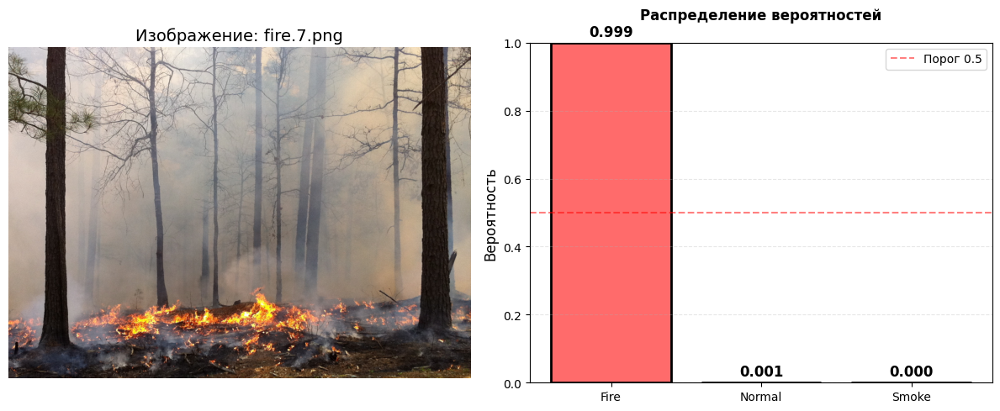


РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ:
  Fire      : 0.999 (99.9%)
  Normal    : 0.001 (0.1%)
  Smoke     : 0.000 (0.0%)

🏆 Основной класс: Fire (вероятность: 0.999)


In [21]:
import torch
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from transformers import AutoImageProcessor, SiglipForImageClassification

# Загрузка модели
model_name = "prithivMLmods/Forest-Fire-Detection"
model = SiglipForImageClassification.from_pretrained(model_name)
processor = AutoImageProcessor.from_pretrained(model_name)

# Сопоставление меток
id2label = {"0": "Fire", "1": "Normal", "2": "Smoke"}

def classify_local_image(image_path):
    """
    Классифицирует локальное изображение и показывает картинку с графиком

    Args:
        image_path: путь к файлу изображения
    """
    # Загружаем изображение
    image = Image.open(image_path).convert("RGB")

    # Предобработка
    inputs = processor(images=image, return_tensors="pt")

    # Предсказание
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.nn.functional.softmax(logits, dim=1).squeeze().tolist()

    # Формируем результат
    predictions = {id2label[str(i)]: round(probs[i], 3) for i in range(len(probs))}

    # Создаем график с двумя субплогами
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # 1. Показываем саму картинку
    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title(f"Изображение: {image_path.split('/')[-1]}", fontsize=14)

    # 2. Строим график вероятностей
    labels = list(predictions.keys())
    values = list(predictions.values())
    colors = ['#FF6B6B', '#4ECDC4', '#FFD166']  # Красный, бирюзовый, желтый

    bars = ax2.bar(labels, values, color=colors, edgecolor='black', linewidth=2)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel('Вероятность', fontsize=12)
    ax2.set_title('Распределение вероятностей', fontsize=12, fontweight='bold', pad=20)
    ax2.grid(axis='y', alpha=0.3, linestyle='--')

    # Добавляем значения на столбцы
    for bar, val in zip(bars, values):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{val:.3f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

    # Добавляем горизонтальную линию на 0.5
    ax2.axhline(y=0.5, color='red', linestyle='--', alpha=0.5, label='Порог 0.5')
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # Выводим текстовые результаты
    print("\n" + "="*50)
    print("РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ:")
    print("="*50)
    for label, prob in predictions.items():
        print(f"  {label:10}: {prob:.3f} ({prob*100:.1f}%)")

    # Определяем основной класс
    main_class = max(predictions, key=predictions.get)
    print(f"\n🏆 Основной класс: {main_class} (вероятность: {predictions[main_class]:.3f})")

    return predictions

# Пример использования
if __name__ == "__main__":
    image_path = "/content/fire.7.png"

    try:
        predictions = classify_local_image(image_path)
    except Exception as e:
        print(f"Ошибка: {e}")

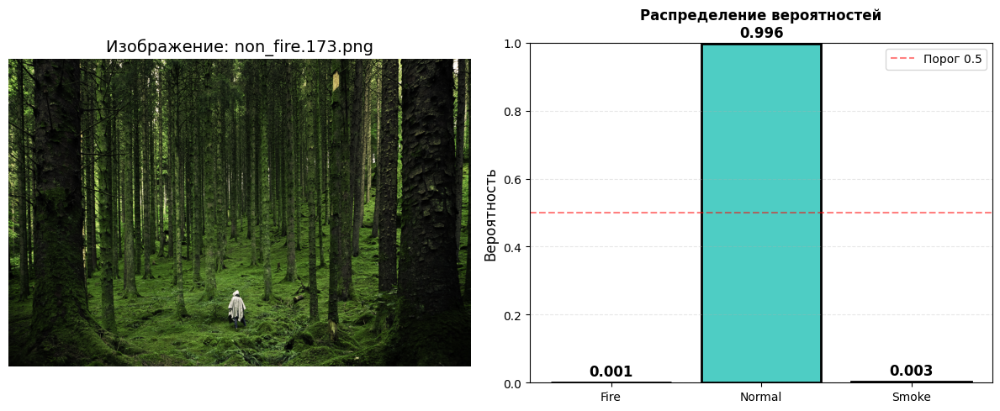


РЕЗУЛЬТАТЫ КЛАССИФИКАЦИИ:
  Fire      : 0.001 (0.1%)
  Normal    : 0.996 (99.6%)
  Smoke     : 0.003 (0.3%)

🏆 Основной класс: Normal (вероятность: 0.996)


In [22]:
# другая картинка
image_path = "/content/non_fire.173.png"
try:
  predictions = classify_local_image(image_path)
except Exception as e:
  print(f"Ошибка: {e}")

# 2. Перебираем весь датасет и выделяем самые интересные кейсы

📥 Загрузка датасета...
Using Colab cache for faster access to the 'wildfire-detection-image-dataset' dataset.
✅ Датасет загружен в: /kaggle/input/wildfire-detection-image-dataset

🔍 Поиск изображений...
✅ Найдено 999 изображений

🚀 Обработка изображений...
📊 Прогресс: 999/999 (100.0%)

✅ Успешно обработано 999/999 изображений

🔥 ТОП-5 САМЫХ УВЕРЕННЫХ ПОЖАРОВ:

#1 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: 1.000
   📁 Файл: non_fire.133.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:1.000, Normal:0.000, Smoke:0.000


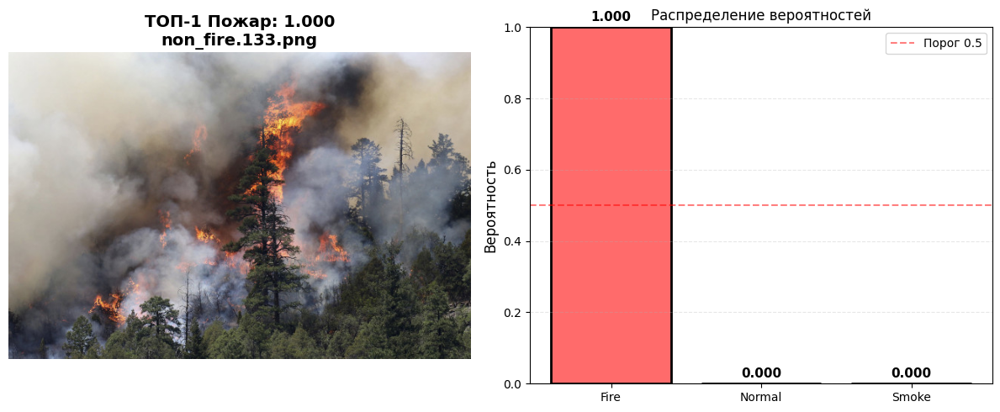


#2 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: 1.000
   📁 Файл: fire.743.png
   📂 Категория в датасете: fire_images
   📊 Fire:1.000, Normal:0.000, Smoke:0.000


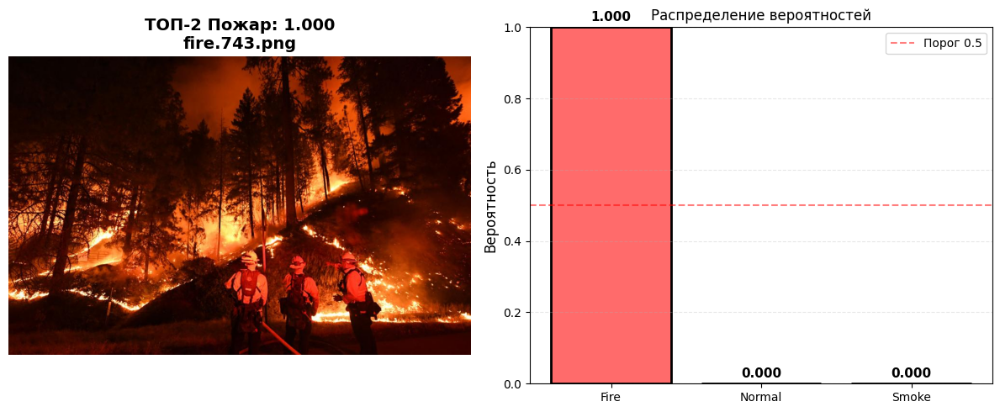


#3 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: 1.000
   📁 Файл: fire.717.png
   📂 Категория в датасете: fire_images
   📊 Fire:1.000, Normal:0.000, Smoke:0.000


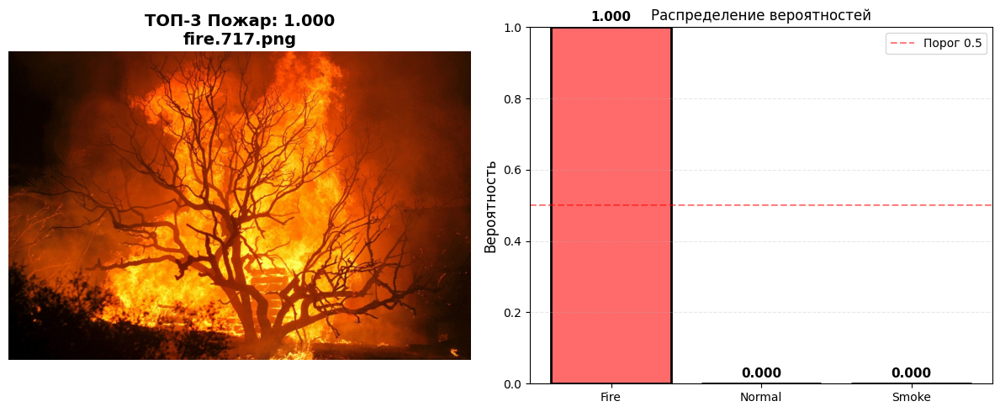


#4 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: 1.000
   📁 Файл: fire.26.png
   📂 Категория в датасете: fire_images
   📊 Fire:1.000, Normal:0.000, Smoke:0.000


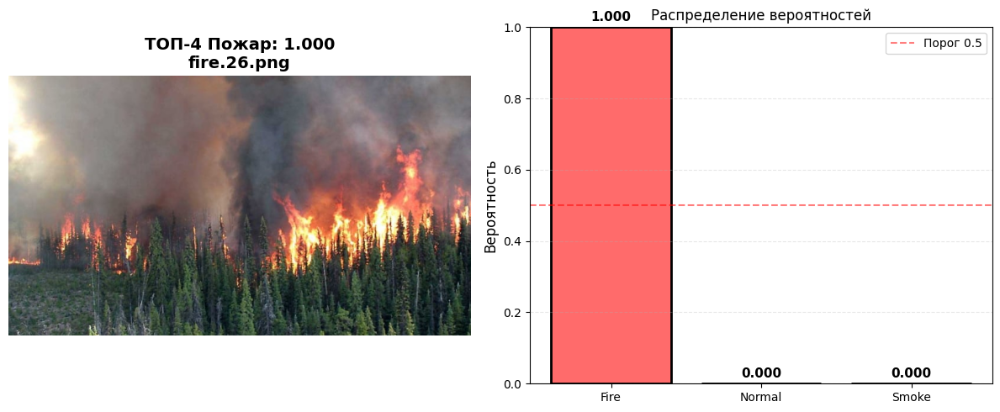


#5 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: 1.000
   📁 Файл: fire.65.png
   📂 Категория в датасете: fire_images
   📊 Fire:1.000, Normal:0.000, Smoke:0.000


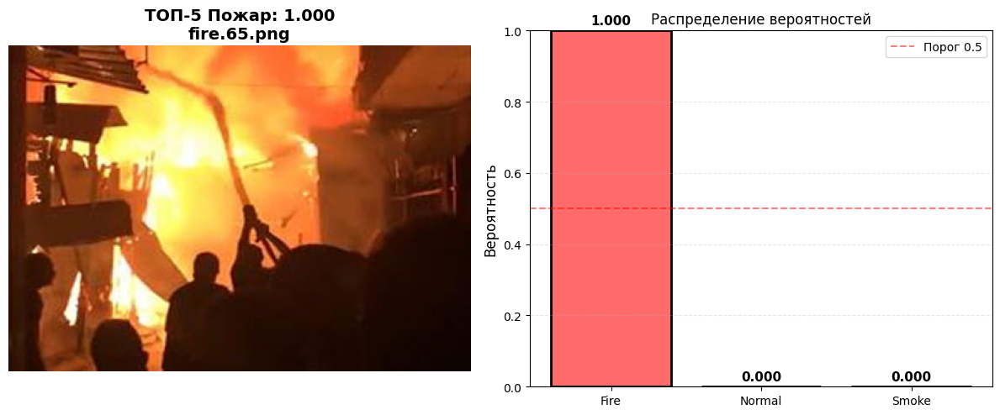


🌲 ТОП-5 САМЫХ УВЕРЕННЫХ НОРМАЛЬНЫХ СЦЕН:

#1 🌲 ВЕРОЯТНОСТЬ НОРМЫ: 0.999
   📁 Файл: non_fire.58.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.000, Normal:0.999, Smoke:0.001


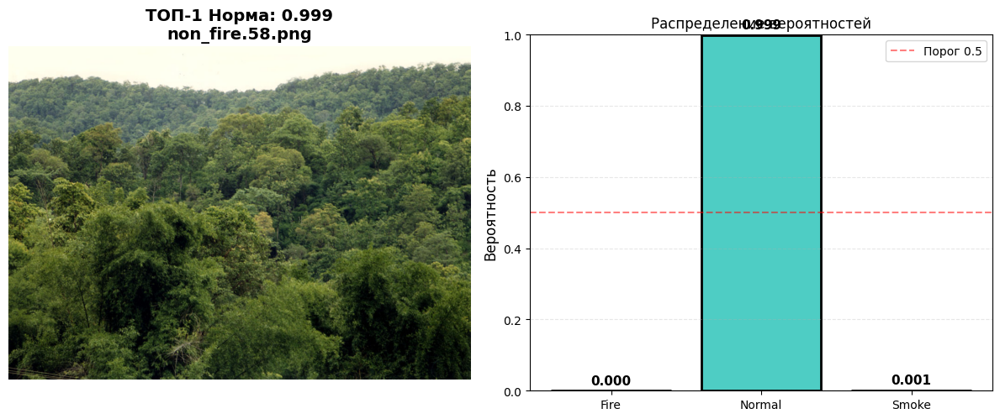


#2 🌲 ВЕРОЯТНОСТЬ НОРМЫ: 0.999
   📁 Файл: non_fire.160.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.000, Normal:0.999, Smoke:0.000


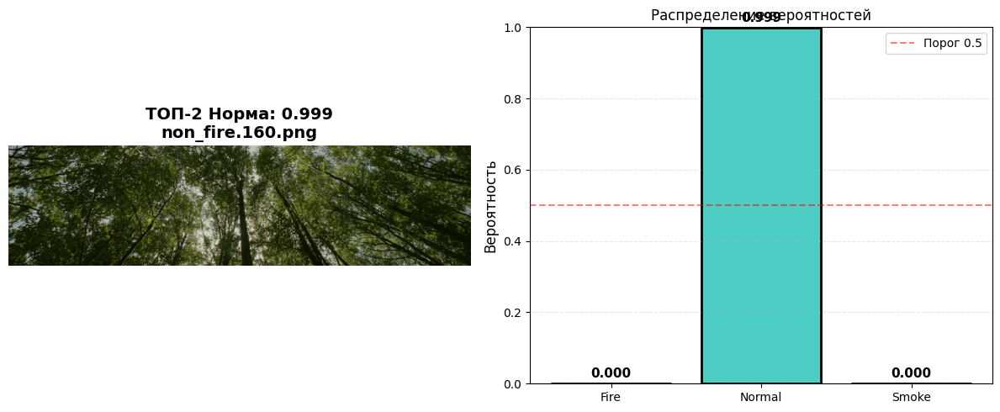


#3 🌲 ВЕРОЯТНОСТЬ НОРМЫ: 0.999
   📁 Файл: non_fire.204.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.000, Normal:0.999, Smoke:0.001


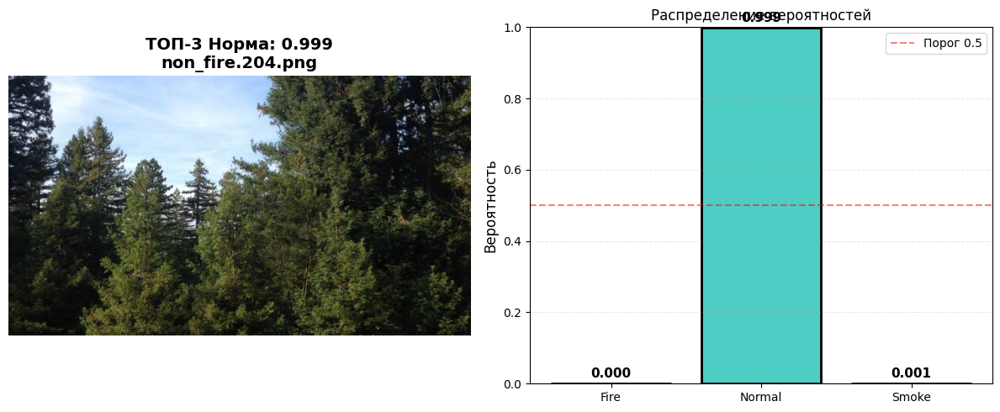


#4 🌲 ВЕРОЯТНОСТЬ НОРМЫ: 0.999
   📁 Файл: non_fire.220.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.000, Normal:0.999, Smoke:0.001


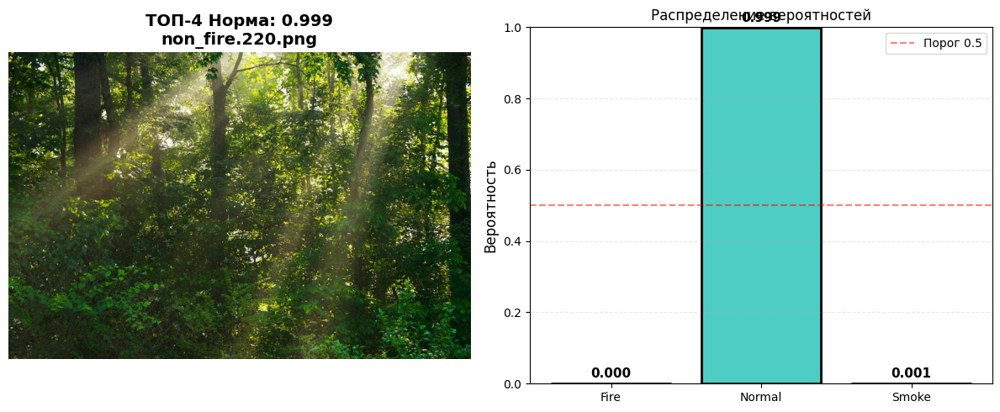


#5 🌲 ВЕРОЯТНОСТЬ НОРМЫ: 0.999
   📁 Файл: non_fire.53.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.001, Normal:0.999, Smoke:0.001


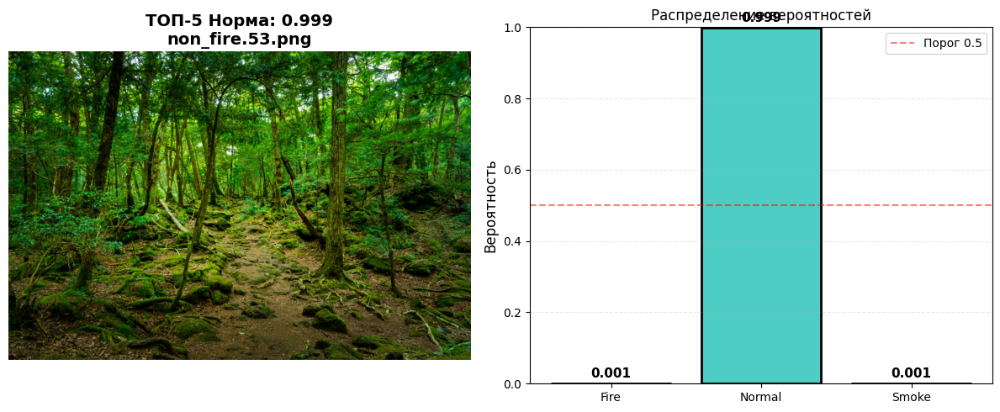


💨 ТОП-5 САМЫХ УВЕРЕННЫХ ДЫМОВ:

#1 💨 ВЕРОЯТНОСТЬ ДЫМА: 0.134
   📁 Файл: non_fire.167.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.758, Normal:0.109, Smoke:0.134


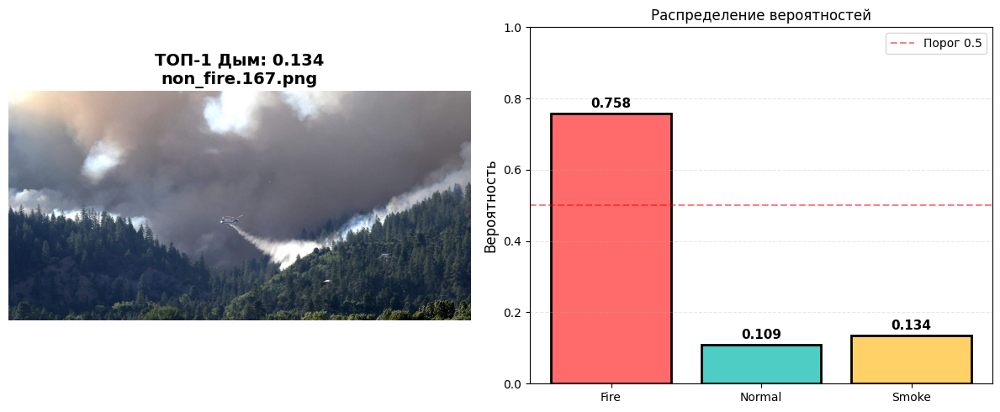


#2 💨 ВЕРОЯТНОСТЬ ДЫМА: 0.112
   📁 Файл: non_fire.129.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.038, Normal:0.850, Smoke:0.112


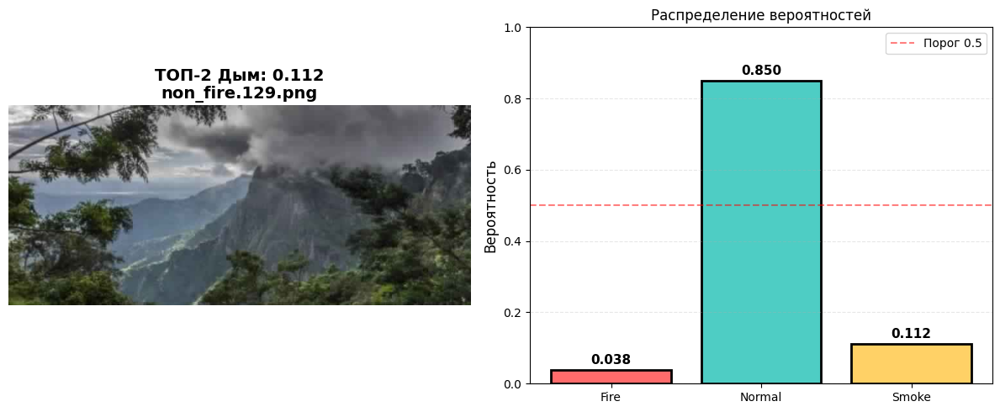


#3 💨 ВЕРОЯТНОСТЬ ДЫМА: 0.051
   📁 Файл: non_fire.65.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.003, Normal:0.946, Smoke:0.051


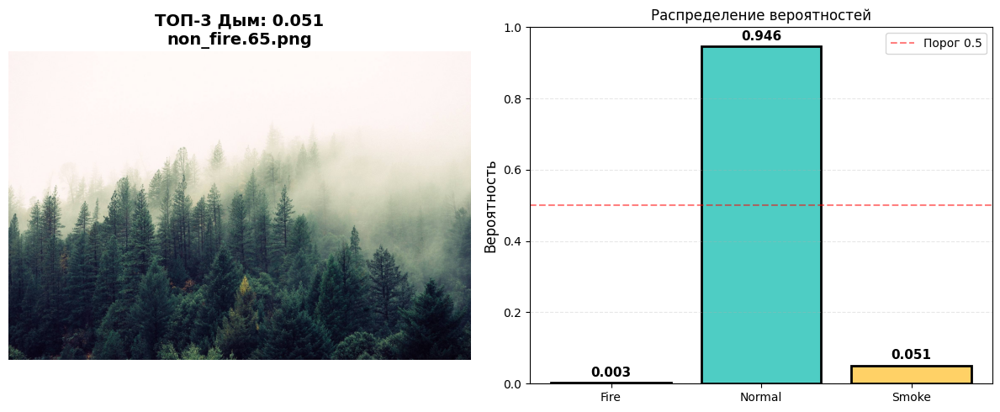


#4 💨 ВЕРОЯТНОСТЬ ДЫМА: 0.049
   📁 Файл: non_fire.20.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.710, Normal:0.242, Smoke:0.049


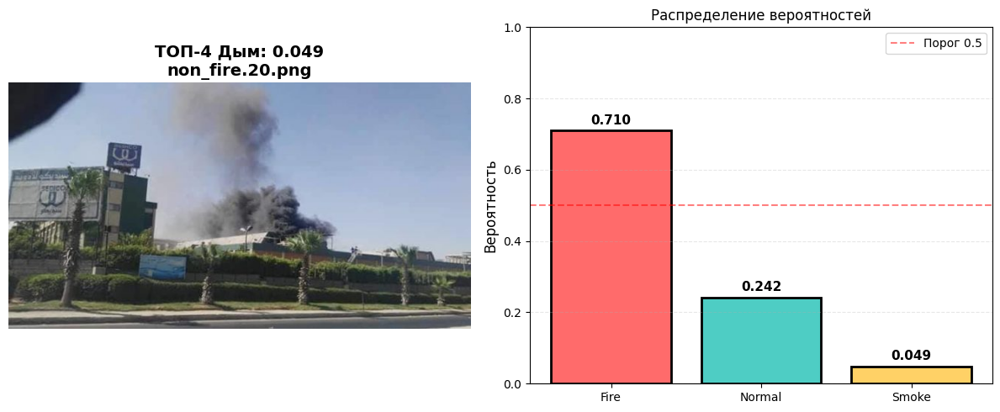


#5 💨 ВЕРОЯТНОСТЬ ДЫМА: 0.046
   📁 Файл: non_fire.206.png
   📂 Категория в датасете: non_fire_images
   📊 Fire:0.001, Normal:0.953, Smoke:0.046


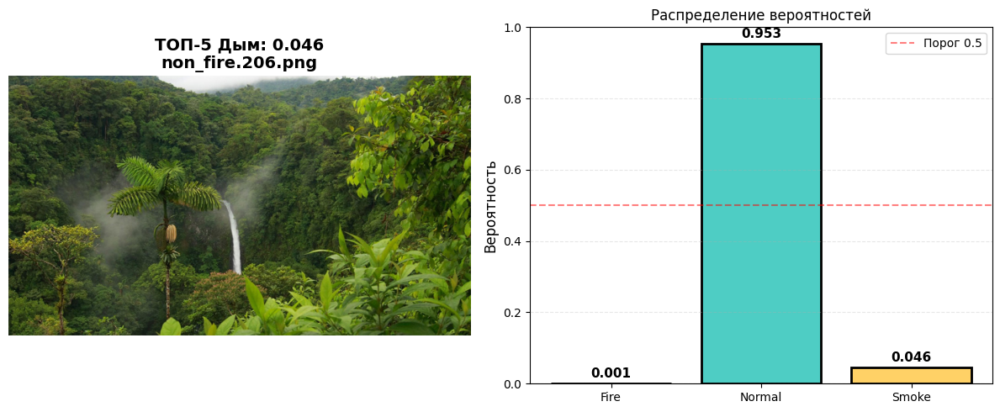


❓ САМЫЕ ПРОТИВОРЕЧИВЫЕ СЛУЧАИ (где модель неуверена):

Показываю 3 самых противоречивых случая:

#1 ❓ НЕУВЕРЕННЫЙ СЛУЧАЙ
   📁 Файл: non_fire.9.png
   📂 Категория в датасете: non_fire_images
   ⚖️  Разница между 1-м и 2-м классом: 0.020
   📊 Fire:0.482, Normal:0.502, Smoke:0.016


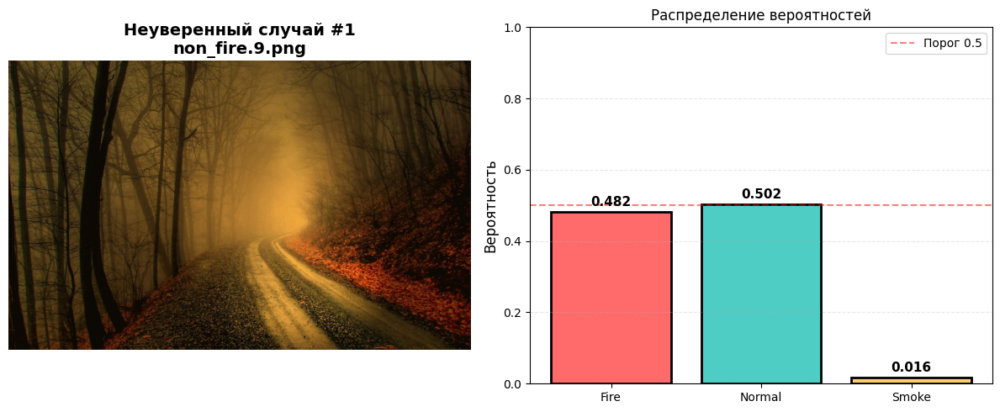


#2 ❓ НЕУВЕРЕННЫЙ СЛУЧАЙ
   📁 Файл: non_fire.9.png
   📂 Категория в датасете: non_fire_images
   ⚖️  Разница между 1-м и 2-м классом: 0.020
   📊 Fire:0.482, Normal:0.502, Smoke:0.016


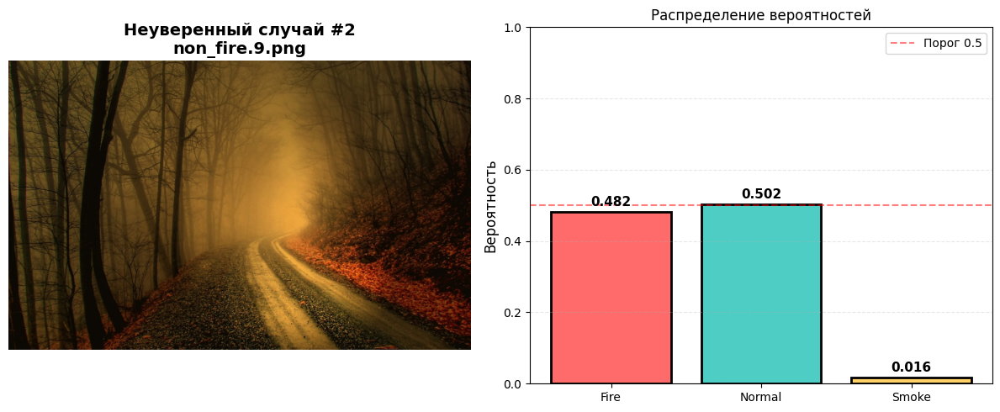


#3 ❓ НЕУВЕРЕННЫЙ СЛУЧАЙ
   📁 Файл: non_fire.9.png
   📂 Категория в датасете: non_fire_images
   ⚖️  Разница между 1-м и 2-м классом: 0.020
   📊 Fire:0.482, Normal:0.502, Smoke:0.016


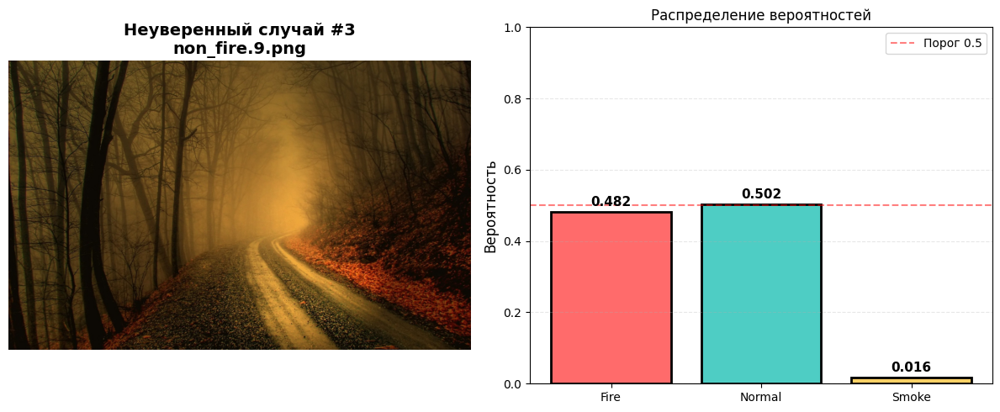


📊 СТАТИСТИКА ПО ДАТАСЕТУ:

📈 Средние вероятности по всему датасету:
   🔥 Средняя вероятность пожара:   0.760
   🌲 Средняя вероятность нормы:    0.238
   💨 Средняя вероятность дыма:     0.001

📁 Всего изображений в датасете: 999
✅ Успешно обработано: 999
❌ Пропущено (ошибки): 0


In [13]:
import torch
from PIL import Image
from pathlib import Path
from transformers import AutoImageProcessor, SiglipForImageClassification
import kagglehub
import matplotlib.pyplot as plt
import numpy as np

# Загрузка модели
model_name = "prithivMLmods/Forest-Fire-Detection"
model = SiglipForImageClassification.from_pretrained(model_name)
processor = AutoImageProcessor.from_pretrained(model_name)

id2label = {"0": "Fire", "1": "Normal", "2": "Smoke"}
class_colors = {"Fire": "#FF6B6B", "Normal": "#4ECDC4", "Smoke": "#FFD166"}

def classify_local_image(image_path):
    """Классифицирует одно изображение"""
    try:
        image = Image.open(image_path).convert("RGB")
        inputs = processor(images=image, return_tensors="pt")

        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits
            probs = torch.nn.functional.softmax(logits, dim=1).squeeze().tolist()

        return {id2label[str(i)]: round(probs[i], 3) for i in range(len(probs))}, image
    except Exception as e:
        print(f"Ошибка с файлом {image_path}: {e}")
        return None, None

def plot_image_with_predictions(image, predictions, title):
    """Отображает картинку с графиком вероятностей"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # 1. Показываем саму картинку
    ax1.imshow(image)
    ax1.axis('off')
    ax1.set_title(title, fontsize=14, fontweight='bold')

    # 2. Строим график вероятностей
    labels = list(predictions.keys())
    values = list(predictions.values())
    colors = [class_colors[label] for label in labels]

    bars = ax2.bar(labels, values, color=colors, edgecolor='black', linewidth=2)
    ax2.set_ylim([0, 1])
    ax2.set_ylabel('Вероятность', fontsize=12)
    ax2.set_title('Распределение вероятностей', fontsize=12)
    ax2.grid(axis='y', alpha=0.3, linestyle='--')

    # Добавляем значения на столбцы
    for bar, val in zip(bars, values):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{val:.3f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

    # Добавляем горизонтальную линию на 0.5
    ax2.axhline(y=0.5, color='red', linestyle='--', alpha=0.5, label='Порог 0.5')
    ax2.legend()

    plt.tight_layout()
    plt.show()

# Загружаем датасет
print("📥 Загрузка датасета...")
path = kagglehub.dataset_download("yumirr/wildfire-detection-image-dataset")
dataset_path = Path(path)
print(f"✅ Датасет загружен в: {dataset_path}")

# Собираем все изображения
print("\n🔍 Поиск изображений...")
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.JPG', '.JPEG', '.PNG', '.BMP']
image_paths = []

for ext in image_extensions:
    image_paths.extend(dataset_path.rglob(f"*{ext}"))

print(f"✅ Найдено {len(image_paths)} изображений")

# Списки для хранения результатов (храним пути, вероятности и предсказания)
fire_results = []    # (путь, вероятность_пожара, все_предсказания)
normal_results = []  # (путь, вероятность_нормы, все_предсказания)
smoke_results = []   # (путь, вероятность_дыма, все_предсказания)

# Обрабатываем все изображения с простым прогресс-баром
print("\n🚀 Обработка изображений...")
success_count = 0

for i, img_path in enumerate(image_paths):
    # Простой прогресс-бар
    progress = (i + 1) / len(image_paths) * 100
    print(f"\r📊 Прогресс: {i+1}/{len(image_paths)} ({progress:.1f}%)", end='', flush=True)

    predictions, image = classify_local_image(img_path)

    if predictions is None or image is None:
        continue

    success_count += 1

    # Сохраняем результаты по категориям
    fire_prob = predictions.get("Fire", 0)
    normal_prob = predictions.get("Normal", 0)
    smoke_prob = predictions.get("Smoke", 0)

    fire_results.append((str(img_path), fire_prob, predictions, image))
    normal_results.append((str(img_path), normal_prob, predictions, image))
    smoke_results.append((str(img_path), smoke_prob, predictions, image))

print(f"\n\n✅ Успешно обработано {success_count}/{len(image_paths)} изображений")

# Сортируем по уверенности и выводим ТОП-5 с картинками
print("\n" + "="*80)
print("🔥 ТОП-5 САМЫХ УВЕРЕННЫХ ПОЖАРОВ:")
print("="*80)
fire_results.sort(key=lambda x: x[1], reverse=True)

for i, (img_path, prob, preds, image) in enumerate(fire_results[:5]):
    filename = Path(img_path).name
    category = Path(img_path).parent.name

    print(f"\n#{i+1} 🔥 ВЕРОЯТНОСТЬ ПОЖАРА: {prob:.3f}")
    print(f"   📁 Файл: {filename}")
    print(f"   📂 Категория в датасете: {category}")
    print(f"   📊 Fire:{preds['Fire']:.3f}, Normal:{preds['Normal']:.3f}, Smoke:{preds['Smoke']:.3f}")

    # Показываем картинку с графиком
    plot_image_with_predictions(
        image,
        preds,
        f"ТОП-{i+1} Пожар: {prob:.3f}\n{filename}"
    )

print("\n" + "="*80)
print("🌲 ТОП-5 САМЫХ УВЕРЕННЫХ НОРМАЛЬНЫХ СЦЕН:")
print("="*80)
normal_results.sort(key=lambda x: x[1], reverse=True)

for i, (img_path, prob, preds, image) in enumerate(normal_results[:5]):
    filename = Path(img_path).name
    category = Path(img_path).parent.name

    print(f"\n#{i+1} 🌲 ВЕРОЯТНОСТЬ НОРМЫ: {prob:.3f}")
    print(f"   📁 Файл: {filename}")
    print(f"   📂 Категория в датасете: {category}")
    print(f"   📊 Fire:{preds['Fire']:.3f}, Normal:{preds['Normal']:.3f}, Smoke:{preds['Smoke']:.3f}")

    # Показываем картинку с графиком
    plot_image_with_predictions(
        image,
        preds,
        f"ТОП-{i+1} Норма: {prob:.3f}\n{filename}"
    )

print("\n" + "="*80)
print("💨 ТОП-5 САМЫХ УВЕРЕННЫХ ДЫМОВ:")
print("="*80)
smoke_results.sort(key=lambda x: x[1], reverse=True)

for i, (img_path, prob, preds, image) in enumerate(smoke_results[:5]):
    filename = Path(img_path).name
    category = Path(img_path).parent.name

    print(f"\n#{i+1} 💨 ВЕРОЯТНОСТЬ ДЫМА: {prob:.3f}")
    print(f"   📁 Файл: {filename}")
    print(f"   📂 Категория в датасете: {category}")
    print(f"   📊 Fire:{preds['Fire']:.3f}, Normal:{preds['Normal']:.3f}, Smoke:{preds['Smoke']:.3f}")

    # Показываем картинку с графиком
    plot_image_with_predictions(
        image,
        preds,
        f"ТОП-{i+1} Дым: {prob:.3f}\n{filename}"
    )

# Выводим самые противоречивые случаи (где все вероятности близки)
print("\n" + "="*80)
print("❓ САМЫЕ ПРОТИВОРЕЧИВЫЕ СЛУЧАИ (где модель неуверена):")
print("="*80)

all_results = fire_results + normal_results + smoke_results

def get_confidence_level(preds):
    """Вычисляет уровень уверенности (разница между первым и вторым классом)"""
    sorted_probs = sorted(list(preds.values()), reverse=True)
    if len(sorted_probs) >= 2:
        return sorted_probs[0] - sorted_probs[1]  # Разница между первым и вторым
    return 0

# Сортируем по минимальной разнице между классами (наименее уверенные)
all_results.sort(key=lambda x: get_confidence_level(x[2]))

print(f"\nПоказываю 3 самых противоречивых случая:")

for i, (img_path, _, preds, image) in enumerate(all_results[:3]):
    filename = Path(img_path).name
    category = Path(img_path).parent.name

    # Находим самый вероятный класс
    max_class = max(preds, key=preds.get)
    max_prob = preds[max_class]

    print(f"\n#{i+1} ❓ НЕУВЕРЕННЫЙ СЛУЧАЙ")
    print(f"   📁 Файл: {filename}")
    print(f"   📂 Категория в датасете: {category}")
    print(f"   ⚖️  Разница между 1-м и 2-м классом: {get_confidence_level(preds):.3f}")
    print(f"   📊 Fire:{preds['Fire']:.3f}, Normal:{preds['Normal']:.3f}, Smoke:{preds['Smoke']:.3f}")

    # Показываем картинку с графиком
    plot_image_with_predictions(
        image,
        preds,
        f"Неуверенный случай #{i+1}\n{filename}"
    )

# Статистика
print("\n" + "="*80)
print("📊 СТАТИСТИКА ПО ДАТАСЕТУ:")
print("="*80)

if success_count > 0:
    avg_fire = sum(f[1] for f in fire_results) / success_count
    avg_normal = sum(n[1] for n in normal_results) / success_count
    avg_smoke = sum(s[1] for s in smoke_results) / success_count

    print(f"\n📈 Средние вероятности по всему датасету:")
    print(f"   🔥 Средняя вероятность пожара:   {avg_fire:.3f}")
    print(f"   🌲 Средняя вероятность нормы:    {avg_normal:.3f}")
    print(f"   💨 Средняя вероятность дыма:     {avg_smoke:.3f}")

    print(f"\n📁 Всего изображений в датасете: {len(image_paths)}")
    print(f"✅ Успешно обработано: {success_count}")
    print(f"❌ Пропущено (ошибки): {len(image_paths) - success_count}")

# 3. Напишем простенький интерфейс для теста модели

In [4]:
import gradio as gr
from transformers import AutoImageProcessor, SiglipForImageClassification
from PIL import Image
import torch

# Load model and processor
model_name = "prithivMLmods/Forest-Fire-Detection"  # Update with actual model name on Hugging Face
model = SiglipForImageClassification.from_pretrained(model_name)
processor = AutoImageProcessor.from_pretrained(model_name)

# Updated label mapping
id2label = {
    "0": "Fire",
    "1": "Normal",
    "2": "Smoke"
}

def classify_image(image):
    image = Image.fromarray(image).convert("RGB")
    inputs = processor(images=image, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.nn.functional.softmax(logits, dim=1).squeeze().tolist()

    prediction = {
        id2label[str(i)]: round(probs[i], 3) for i in range(len(probs))
    }

    return prediction

# Gradio Interface
iface = gr.Interface(
    fn=classify_image,
    inputs=gr.Image(type="numpy"),
    outputs=gr.Label(num_top_classes=3, label="Forest Fire Detection"),
    title="Forest-Fire-Detection",
    description="Upload an image to detect whether the scene contains fire, smoke, or is normal."
)

if __name__ == "__main__":
    iface.launch()


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://90cf2ac06eef929ad6.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## Продемонстрируем работу кода выше (мало ли вывод не сохранился в ячейке)

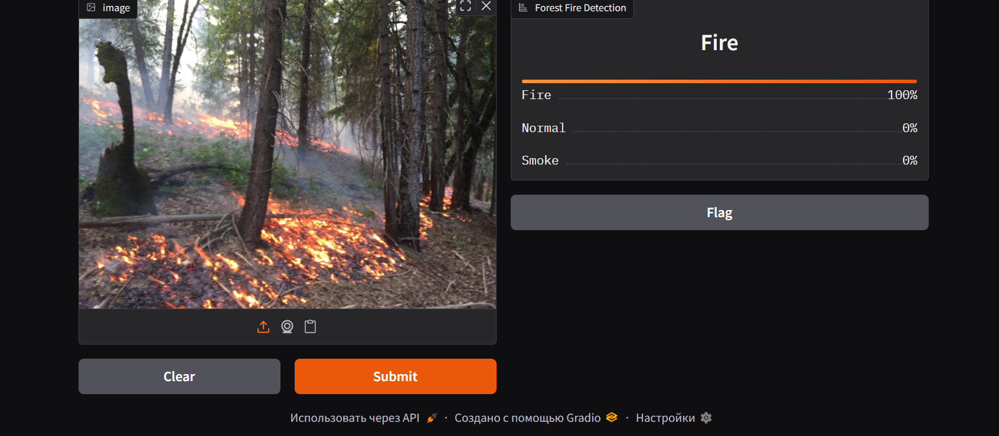